Analysis-Hourly energy demand generation and weather dataset.
This dataset contains 4 years of electrical consumption, generation, pricing, and weather data for Spain. Consumption and generation data was retrieved from ENTSOE a public portal for Transmission Service Operator (TSO) data. Settlement prices were obtained from the Spanish TSO Red Electric España. Weather data was purchased as part of a personal project from the Open Weather API for the 5 largest cities in Spain and made public.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sn
from matplotlib.pylab import rcParams
rcParams['figure.figsize']=20,5
import ipywidgets as widgets
from IPython.display import display
          

In [2]:
df_energy = pd.read_csv('energy_dataset.csv')
df_energy.head()

,time,generation biomass,generation fossil brown coal/lignite,generation fossil coal-derived gas,generation fossil gas,generation fossil hard coal,generation fossil oil,generation fossil oil shale,generation fossil peat,generation geothermal,...,generation waste,generation wind offshore,generation wind onshore,forecast solar day ahead,forecast wind offshore eday ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual
0,2015-01-01 00:00:00+01:00,447.0,329.0,0.0,4844.0,4821.0,162.0,0.0,0.0,0.0,...,196.0,0.0,6378.0,17.0,NaN,6436.0,26118.0,25385.0,50.10,65.41
1,2015-01-01 01:00:00+01:00,449.0,328.0,0.0,5196.0,4755.0,158.0,0.0,0.0,0.0,...,195.0,0.0,5890.0,16.0,NaN,5856.0,24934.0,24382.0,48.10,64.92
2,2015-01-01 02:00:00+01:00,448.0,323.0,0.0,4857.0,4581.0,157.0,0.0,0.0,0.0,...,196.0,0.0,5461.0,8.0,NaN,5454.0,23515.0,22734.0,47.33,64.48
3,2015-01-01 03:00:00+01:00,438.0,254.0,0.0,4314.0,4131.0,160.0,0.0,0.0,0.0,...,191.0,0.0,5238.0,2.0,NaN,5151.0,22642.0,21286.0,42.27,59.32
4,2015-01-01 04:00:00+01:00,428.0,187.0,0.0,4130.0,3840.0,156.0,0.0,0.0,0.0,...,189.0,0.0,4935.0,9.0,NaN,4861.0,21785.0,20264.0,38.41,56.04


In [3]:
# Drop unusable columns

df_energy = df_energy.drop(['generation fossil coal-derived gas','generation fossil oil shale', 
                            'generation fossil peat', 'generation geothermal', 
                            'generation hydro pumped storage aggregated', 'generation marine', 
                            'generation wind offshore', 'forecast wind offshore eday ahead'], 
                            axis=1)
#adding missing values
df_energy.fillna(df_energy.mean(), inplace=True)
df_energy.head()

,time,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,...,generation other renewable,generation solar,generation waste,generation wind onshore,forecast solar day ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual
0,2015-01-01 00:00:00+01:00,447.0,329.0,4844.0,4821.0,162.0,863.0,1051.0,1899.0,7096.0,...,73.0,49.0,196.0,6378.0,17.0,6436.0,26118.0,25385.0,50.10,65.41
1,2015-01-01 01:00:00+01:00,449.0,328.0,5196.0,4755.0,158.0,920.0,1009.0,1658.0,7096.0,...,71.0,50.0,195.0,5890.0,16.0,5856.0,24934.0,24382.0,48.10,64.92
2,2015-01-01 02:00:00+01:00,448.0,323.0,4857.0,4581.0,157.0,1164.0,973.0,1371.0,7099.0,...,73.0,50.0,196.0,5461.0,8.0,5454.0,23515.0,22734.0,47.33,64.48
3,2015-01-01 03:00:00+01:00,438.0,254.0,4314.0,4131.0,160.0,1503.0,949.0,779.0,7098.0,...,75.0,50.0,191.0,5238.0,2.0,5151.0,22642.0,21286.0,42.27,59.32
4,2015-01-01 04:00:00+01:00,428.0,187.0,4130.0,3840.0,156.0,1826.0,953.0,720.0,7097.0,...,74.0,42.0,189.0,4935.0,9.0,4861.0,21785.0,20264.0,38.41,56.04


In [4]:
df_energy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 21 columns):
time                                           35064 non-null object
generation biomass                             35064 non-null float64
generation fossil brown coal/lignite           35064 non-null float64
generation fossil gas                          35064 non-null float64
generation fossil hard coal                    35064 non-null float64
generation fossil oil                          35064 non-null float64
generation hydro pumped storage consumption    35064 non-null float64
generation hydro run-of-river and poundage     35064 non-null float64
generation hydro water reservoir               35064 non-null float64
generation nuclear                             35064 non-null float64
generation other                               35064 non-null float64
generation other renewable                     35064 non-null float64
generation solar                               35064

In [5]:
from datetime import datetime
df_energy['time']=pd.to_datetime(df_energy['time'],utc=True,format='%Y-%m-%d %H:%M:%S')
#indexed_df=df_energy.set_index('time')
#indexed_df.head()

In [6]:
dateTime=df_energy['time']
dateTime.head()

0   2014-12-31 23:00:00+00:00
1   2015-01-01 00:00:00+00:00
2   2015-01-01 01:00:00+00:00
3   2015-01-01 02:00:00+00:00
4   2015-01-01 03:00:00+00:00
Name: time, dtype: datetime64[ns, UTC]

In [7]:
df_energy.head(51)

,time,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,...,generation other renewable,generation solar,generation waste,generation wind onshore,forecast solar day ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual
0,2014-12-31 23:00:00+00:00,447.0,329.0,4844.0,4821.0,162.0,863.0,1051.0,1899.0,7096.0,...,73.0,49.0,196.0,6378.0,17.0,6436.0,26118.0,25385.0,50.10,65.41
1,2015-01-01 00:00:00+00:00,449.0,328.0,5196.0,4755.0,158.0,920.0,1009.0,1658.0,7096.0,...,71.0,50.0,195.0,5890.0,16.0,5856.0,24934.0,24382.0,48.10,64.92
2,2015-01-01 01:00:00+00:00,448.0,323.0,4857.0,4581.0,157.0,1164.0,973.0,1371.0,7099.0,...,73.0,50.0,196.0,5461.0,8.0,5454.0,23515.0,22734.0,47.33,64.48
3,2015-01-01 02:00:00+00:00,438.0,254.0,4314.0,4131.0,160.0,1503.0,949.0,779.0,7098.0,...,75.0,50.0,191.0,5238.0,2.0,5151.0,22642.0,21286.0,42.27,59.32
4,2015-01-01 03:00:00+00:00,428.0,187.0,4130.0,3840.0,156.0,1826.0,953.0,720.0,7097.0,...,74.0,42.0,189.0,4935.0,9.0,4861.0,21785.0,20264.0,38.41,56.04
5,2015-01-01 04:00:00+00:00,410.0,178.0,4038.0,3590.0,156.0,2109.0,952.0,743.0,7098.0,...,74.0,34.0,188.0,4618.0,4.0,4617.0,21441.0,19905.0,35.72,53.63
6,2015-01-01 05:00:00+00:00,401.0,172.0,4040.0,3368.0,158.0,2108.0,961.0,848.0,7098.0,...,74.0,34.0,186.0,4397.0,3.0,4276.0,21285.0,20010.0,35.13,51.73
7,2015-01-01 06:00:00+00:00,408.0,172.0,4030.0,3208.0,160.0,2031.0,983.0,1012.0,7099.0,...,72.0,35.0,189.0,3992.0,12.0,3994.0,21545.0,20377.0,36.22,51.43
8,2015-01-01 07:00:00+00:00,413.0,177.0,4052.0,3335.0,161.0,2119.0,1001.0,1015.0,7098.0,...,73.0,54.0,198.0,3629.0,39.0,3602.0,21443.0,20094.0,32.40,48.98
9,2015-01-01 08:00:00+00:00,419.0,177.0,4137.0,3437.0,163.0,2170.0,1041.0,1357.0,7097.0,...,74.0,743.0,198.0,3073.0,784.0,3212.0,21560.0,20637.0,36.60,54.20


In [8]:
dateTime[50].day

3

In [9]:
df_energy['price actual'][50]

58.79

In [10]:
df_energy['generation biomass'][50]

452.0

In [11]:
range (0,len(df_energy)+1)

range(0, 35065)

In [12]:
dateTime[50]

Timestamp('2015-01-03 01:00:00+0000', tz='UTC')

Generation wind onshore for one year data 

C:\Users\pc\Anaconda3\Lib\site-packages\pandas\plotting\_converter.py:129: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


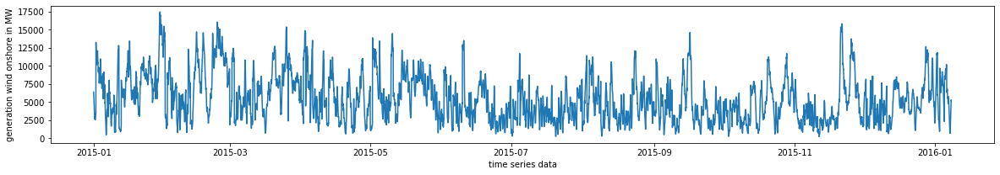

In [13]:
#separating one year data for chosen column
#Generation wind onshore for one year data 
def OneColumnHourly(name):
    x=[]
    y=[]
    for i in range(0,8928):#len(df_energy)):
        x.append(dateTime[i])
        y.append(df_energy[name][i])
    plt.rcParams["figure.figsize"] = (20,3)
    plt.xlabel('time series data')
    plt.ylabel(f'{name} in MW')
    plt.plot(x,y)
OneColumnHourly('generation wind onshore')    

Generation solar for one year data

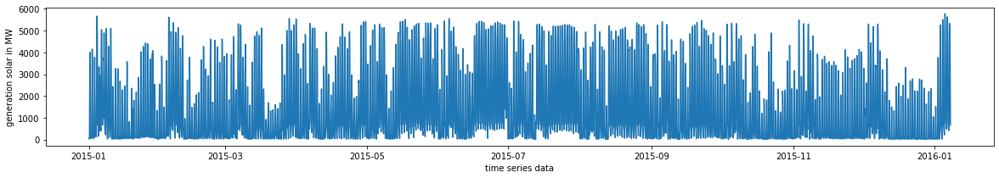

In [14]:
#separating one year data for chosen column
#Generation solar for one year data
OneColumnHourly('generation solar')   

In [15]:
df_energy.shape

(35064, 21)

In [16]:
df_energy['generation wind onshore'].sum()

191606518.63585

In [17]:
df_energy.columns

Index(['time', 'generation biomass', 'generation fossil brown coal/lignite',
       'generation fossil gas', 'generation fossil hard coal',
       'generation fossil oil', 'generation hydro pumped storage consumption',
       'generation hydro run-of-river and poundage',
       'generation hydro water reservoir', 'generation nuclear',
       'generation other', 'generation other renewable', 'generation solar',
       'generation waste', 'generation wind onshore',
       'forecast solar day ahead', 'forecast wind onshore day ahead',
       'total load forecast', 'total load actual', 'price day ahead',
       'price actual'],
      dtype='object')

In [18]:
#Adding new column with total production
total_production = df_energy['generation biomass'] + df_energy['generation fossil brown coal/lignite'] + \
              df_energy['generation fossil gas'] + df_energy['generation fossil hard coal']+ \
            df_energy['generation fossil oil'] + df_energy['generation hydro pumped storage consumption']+ \
            df_energy['generation hydro run-of-river and poundage'] + df_energy['generation hydro water reservoir']+ \
            df_energy['generation nuclear'] + df_energy['generation other']+ \
            df_energy['generation other renewable'] + df_energy['generation solar']-df_energy['generation waste']+ \
            df_energy['generation wind onshore'] 



df_energy.insert(loc=len(df_energy.columns)-2, column='Total production', value=total_production) 

df_energy.head()

,time,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,...,generation solar,generation waste,generation wind onshore,forecast solar day ahead,forecast wind onshore day ahead,total load forecast,total load actual,Total production,price day ahead,price actual
0,2014-12-31 23:00:00+00:00,447.0,329.0,4844.0,4821.0,162.0,863.0,1051.0,1899.0,7096.0,...,49.0,196.0,6378.0,17.0,6436.0,26118.0,25385.0,27859.0,50.10,65.41
1,2015-01-01 00:00:00+00:00,449.0,328.0,5196.0,4755.0,158.0,920.0,1009.0,1658.0,7096.0,...,50.0,195.0,5890.0,16.0,5856.0,24934.0,24382.0,27428.0,48.10,64.92
2,2015-01-01 01:00:00+00:00,448.0,323.0,4857.0,4581.0,157.0,1164.0,973.0,1371.0,7099.0,...,50.0,196.0,5461.0,8.0,5454.0,23515.0,22734.0,26404.0,47.33,64.48
3,2015-01-01 02:00:00+00:00,438.0,254.0,4314.0,4131.0,160.0,1503.0,949.0,779.0,7098.0,...,50.0,191.0,5238.0,2.0,5151.0,22642.0,21286.0,24841.0,42.27,59.32
4,2015-01-01 03:00:00+00:00,428.0,187.0,4130.0,3840.0,156.0,1826.0,953.0,720.0,7097.0,...,42.0,189.0,4935.0,9.0,4861.0,21785.0,20264.0,24242.0,38.41,56.04


In [19]:
#Adding widgets for showing percentage (rounded value to two decimal places) of total production for every type of generation
from ipywidgets import Button,Layout,HBox,VBox
l=Layout(width='150%',height='200px')
btn1 = widgets.Button(description='generation biomass')
btn2 = widgets.Button(description='generation fossil brown coal/lignite')
btn3 = widgets.Button(description='generation fossil gas')
btn4 = widgets.Button(description='generation fossil hard coal')
btn5 = widgets.Button(description='generation fossil oil')
btn6 = widgets.Button(description='generation hydro pumped storage consumption')
btn7 = widgets.Button(description='generation hydro run-of-river and poundage')
btn8 = widgets.Button(description='generation hydro water reservoir')
btn9 = widgets.Button(description='generation nuclear')
btn10 = widgets.Button(description='generation other')
btn11 = widgets.Button(description='generation other renewable')
btn12 = widgets.Button(description='generation solar')
btn13 = widgets.Button(description='generation wind onshore')

def percentage(btn_object):
    if btn_object==btn1:
        print(f"{btn1.description.upper()} takes {(df_energy[btn1.description].sum()*100/df_energy['Total production'].sum()):.2f}% of total production.")
    if btn_object==btn2:
        print(f"{btn2.description.upper()} takes {(df_energy[btn2.description].sum()*100/df_energy['Total production'].sum()):.2f}% of total production.")
    if btn_object==btn3:
        print(f"{btn3.description.upper()} takes {(df_energy[btn3.description].sum()*100/df_energy['Total production'].sum()):.2f}% of total production.")
    if btn_object==btn4:
        print(f"{btn4.description.upper()} takes {(df_energy[btn4.description].sum()*100/df_energy['Total production'].sum()):.2f}% of total production.")
    if btn_object==btn5:
        print(f"{btn5.description.upper()} takes {(df_energy[btn5.description].sum()*100/df_energy['Total production'].sum()):.2f}% of total production.")
    if btn_object==btn6:
        print(f"{btn6.description.upper()} takes {(df_energy[btn6.description].sum()*100/df_energy['Total production'].sum()):.2f}% of total production.")
    if btn_object==btn7:
        print(f"{btn7.description.upper()} takes {(df_energy[btn7.description].sum()*100/df_energy['Total production'].sum()):.2f}% of total production.")
    if btn_object==btn8:
        print(f"{btn8.description.upper()} takes {(df_energy[btn8.description].sum()*100/df_energy['Total production'].sum()):.2f}% of total production.")
    if btn_object==btn9:
        print(f"{btn9.description.upper()} takes {(df_energy[btn9.description].sum()*100/df_energy['Total production'].sum()):.2f}% of total production.")
    if btn_object==btn10:
        print(f"{btn10.description.upper()} takes {(df_energy[btn10.description].sum()*100/df_energy['Total production'].sum()):.2f}% of total production.")
    if btn_object==btn11:
        print(f"{btn11.description.upper()} takes {(df_energy[btn11.description].sum()*100/df_energy['Total production'].sum()):.2f}% of total production.")
    if btn_object==btn12:
        print(f"{btn12.description.upper()} takes {(df_energy[btn12.description].sum()*100/df_energy['Total production'].sum()):.2f}% of total production.")
    if btn_object==btn13:
        print(f"{btn13.description.upper()} takes {(df_energy[btn13.description].sum()*100/df_energy['Total production'].sum()):.2f}% of total production.")
                        
        
   
btn1.on_click(percentage)
btn2.on_click(percentage)                 
btn3.on_click(percentage)
btn4.on_click(percentage)
btn5.on_click(percentage)
btn6.on_click(percentage)                 
btn7.on_click(percentage)
btn8.on_click(percentage)
btn9.on_click(percentage)
btn10.on_click(percentage)                 
btn11.on_click(percentage)
btn12.on_click(percentage)   
btn13.on_click(percentage)
print(f'Percentage of total generation in period {dateTime[0]} till {dateTime[len(df_energy)-1]} :')
#display(btn1,btn2,btn3,btn4,btn5,btn6,btn7,btn8,btn9,btn10,btn11,btn12,btn13)

left_box=VBox([btn1,btn2,btn3,btn4,btn5])
center_box=VBox([btn6,btn7,btn8,btn9,btn10])
right_box=VBox([btn11,btn12,btn13]) 


HBox([left_box,center_box,right_box])      


Percentage of total generation in period 2014-12-31 23:00:00+00:00 till 2018-12-31 22:00:00+00:00 :


GENERATION WIND ONSHORE takes 19.45% of total production.
GENERATION NUCLEAR takes 22.29% of total production.
GENERATION SOLAR takes 5.10% of total production.


Text(0, 0.5, 'total load actual in MWh')

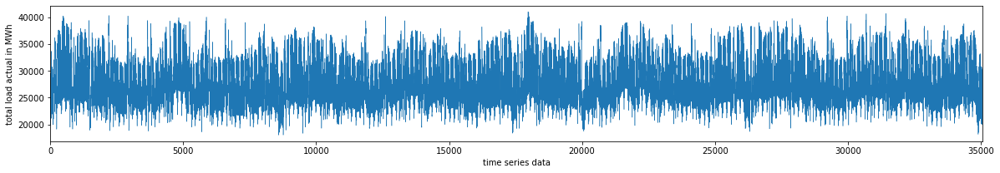

In [20]:
df_energy['total load actual'].plot(linewidth=0.5)
plt.xlabel('time series data')
plt.ylabel(f'total load actual in MWh')

Comparing total load actual, generation wind onshore and generation solar (4 years data)

Solar power in Spain though significant produced less than wind power but solar potential for Spain is amongst the best in Europe, if not the best. 



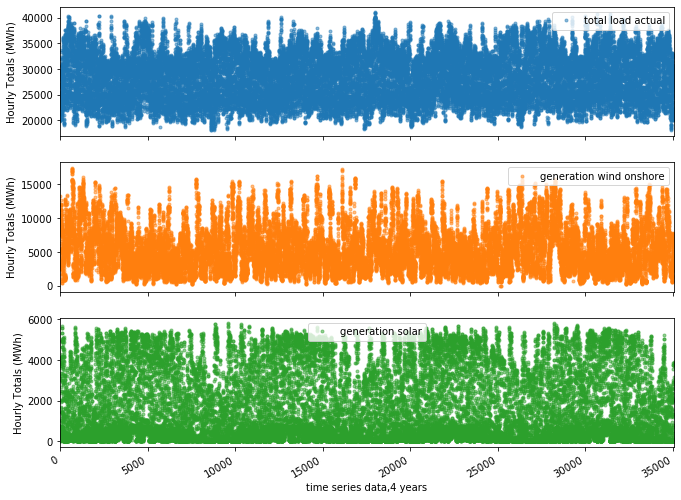

In [21]:
columns_plot=['total load actual','generation wind onshore','generation solar']
axes = df_energy[columns_plot].plot(marker='.', alpha=0.5, linestyle='None', figsize=(11, 9), subplots=True)
for ax in axes:
    ax.set_ylabel('Hourly Totals (MWh)')
    ax.set_xlabel('time series data,4 years')

Solar power generation curve matches the net load curve during best part of the day, adjusting the demand for electricity with supply, reducing the cost of electricity during central hours.

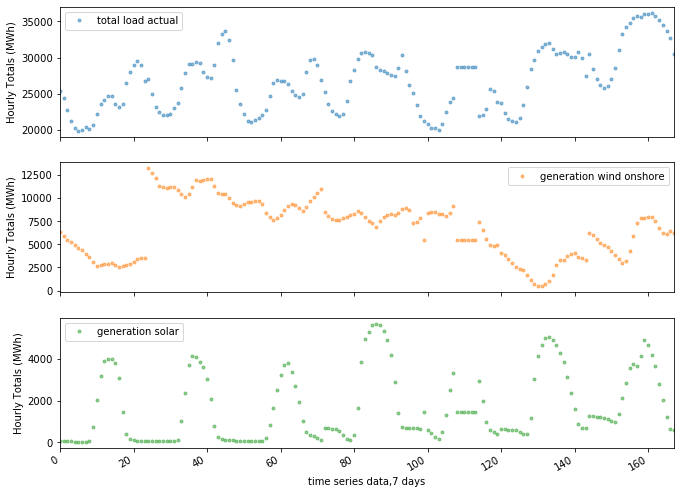

In [22]:
columns_plot=['total load actual','generation wind onshore','generation solar']
axes = df_energy[columns_plot][0:168].plot(marker='.', alpha=0.5, linestyle='None', figsize=(11, 9), subplots=True)
for ax in axes:
    ax.set_ylabel('Hourly Totals (MWh)')
    ax.set_xlabel('time series data,7 days')

Weather Features

In [23]:
df_weather = pd.read_csv('weather_features.csv')
df_weather.head()

,dt_iso,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon
0,2015-01-01 00:00:00+01:00,Valencia,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,800,clear,sky is clear,01n
1,2015-01-01 01:00:00+01:00,Valencia,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,800,clear,sky is clear,01n
2,2015-01-01 02:00:00+01:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n
3,2015-01-01 03:00:00+01:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n
4,2015-01-01 04:00:00+01:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n


In [24]:
df_weather.tail()

,dt_iso,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon
178391,2018-12-31 19:00:00+01:00,Seville,287.76,287.15,288.15,1028,54,3,30,0.0,0.0,0.0,0,800,clear,sky is clear,01n
178392,2018-12-31 20:00:00+01:00,Seville,285.76,285.15,286.15,1029,62,3,30,0.0,0.0,0.0,0,800,clear,sky is clear,01n
178393,2018-12-31 21:00:00+01:00,Seville,285.15,285.15,285.15,1028,58,4,50,0.0,0.0,0.0,0,800,clear,sky is clear,01n
178394,2018-12-31 22:00:00+01:00,Seville,284.15,284.15,284.15,1029,57,4,60,0.0,0.0,0.0,0,800,clear,sky is clear,01n
178395,2018-12-31 23:00:00+01:00,Seville,283.97,282.15,285.15,1029,70,3,50,0.0,0.0,0.0,0,800,clear,sky is clear,01n


In [25]:
df_weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178396 entries, 0 to 178395
Data columns (total 17 columns):
dt_iso                 178396 non-null object
city_name              178396 non-null object
temp                   178396 non-null float64
temp_min               178396 non-null float64
temp_max               178396 non-null float64
pressure               178396 non-null int64
humidity               178396 non-null int64
wind_speed             178396 non-null int64
wind_deg               178396 non-null int64
rain_1h                178396 non-null float64
rain_3h                178396 non-null float64
snow_3h                178396 non-null float64
clouds_all             178396 non-null int64
weather_id             178396 non-null int64
weather_main           178396 non-null object
weather_description    178396 non-null object
weather_icon           178396 non-null object
dtypes: float64(6), int64(6), object(5)
memory usage: 23.1+ MB


In [26]:
from datetime import datetime
df_weather['dt_iso']=pd.to_datetime(df_weather['dt_iso'],utc=True,format='%Y-%m-%d %H:%M:%S')
timeindexed_df_weather=df_weather.set_index(['dt_iso'])

timeindexed_df_weather.head()

,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon
dt_iso,,,,,,,,,,,,,,,,
2014-12-31 23:00:00+00:00,Valencia,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,800,clear,sky is clear,01n
2015-01-01 00:00:00+00:00,Valencia,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,800,clear,sky is clear,01n
2015-01-01 01:00:00+00:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n
2015-01-01 02:00:00+00:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n
2015-01-01 03:00:00+00:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n


In [27]:
timeindexed_df_weather['city_name'].unique()

array(['Valencia', 'Madrid', 'Bilbao', ' Barcelona', 'Seville'],
      dtype=object)

In [28]:
#mapping cities in Spain (from dataset), 5 largest cities where the highest power consumption is located

#weather features dataset contains weather data for the 5 largest cities in Spain
import folium
cities_in_Spain = [(41.398371, 2.1741),(43.260919,-2.938764),(40.412752,-3.707721),(37.382826,-5.973167),(39.466667,-0.366667)]
m = folium.Map(location=[70, 100],zoom_start=1)

folium.Marker(location=cities_in_Spain[0]).add_to(m)
folium.Marker(location=cities_in_Spain[1]).add_to(m)
folium.Marker(location=cities_in_Spain[2]).add_to(m)
folium.Marker(location=cities_in_Spain[3]).add_to(m)
folium.Marker(location=cities_in_Spain[4]).add_to(m)

m

Aragon, in the north east of Spain, is one of the regions with higher potential for wind generation in Europe with annual average wind speeds around 6.5 m/s

Extracting data for Madrid as the largest city


In [29]:
#weather data for Madrid separated in other csv file
#reading this csv file
weather_data_Madrid = pd.read_csv('weather_Madrid.csv')
weather_data_Madrid['dt_iso']=pd.to_datetime(weather_data_Madrid['dt_iso'],utc=True,format='%Y-%m-%d %H:%M:%S')
timeindexed_weather_data_Madrid=weather_data_Madrid.set_index(['dt_iso'])
timeindexed_weather_data_Madrid.head()

,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon
dt_iso,,,,,,,,,,,,,,,,
2014-12-31 23:00:00+00:00,Madrid,267.325,267.325,267.325,971,63,1,309,0.0,0.0,0.0,0,800,clear,sky is clear,01n
2015-01-01 00:00:00+00:00,Madrid,267.325,267.325,267.325,971,63,1,309,0.0,0.0,0.0,0,800,clear,sky is clear,01n
2015-01-01 01:00:00+00:00,Madrid,266.186,266.186,266.186,971,64,1,273,0.0,0.0,0.0,0,800,clear,sky is clear,01n
2015-01-01 02:00:00+00:00,Madrid,266.186,266.186,266.186,971,64,1,273,0.0,0.0,0.0,0,800,clear,sky is clear,01n
2015-01-01 03:00:00+00:00,Madrid,266.186,266.186,266.186,971,64,1,273,0.0,0.0,0.0,0,800,clear,sky is clear,01n


In [30]:
timeindexed_weather_data_Madrid.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 36263 entries, 2014-12-31 23:00:00+00:00 to 2018-12-31 22:00:00+00:00
Data columns (total 16 columns):
city_name              36263 non-null object
temp                   36263 non-null float64
temp_min               36263 non-null float64
temp_max               36263 non-null float64
pressure               36263 non-null int64
humidity               36263 non-null int64
wind_speed             36263 non-null int64
wind_deg               36263 non-null int64
rain_1h                36263 non-null float64
rain_3h                36263 non-null float64
snow_3h                36263 non-null float64
clouds_all             36263 non-null int64
weather_id             36263 non-null int64
weather_main           36263 non-null object
weather_description    36263 non-null object
weather_icon           36263 non-null object
dtypes: float64(6), int64(6), object(4)
memory usage: 4.7+ MB


In [31]:
#making new data frame with temperature in Madrid and replacing information for temperature,°C = K - 273,15

temp_Madrid=timeindexed_weather_data_Madrid['temp']
temp_Madrid=temp_Madrid.apply(lambda x:x-273,15)
temp_Madrid.describe()


count    36263.000000
mean        15.060881
std          9.298953
min         -8.868000
25%          8.120000
50%         13.580000
75%         21.720000
max         40.330000
Name: temp, dtype: float64

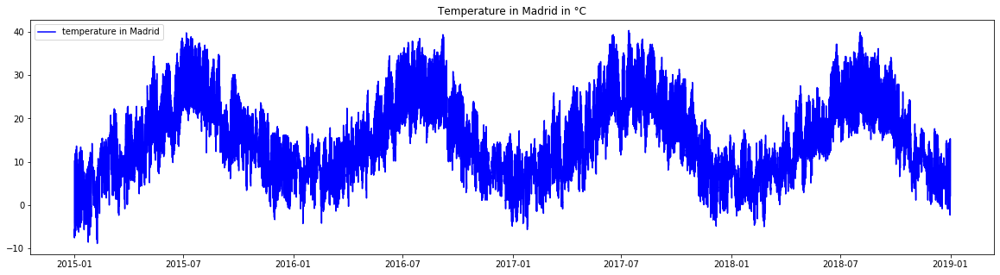

In [32]:
#plotting temperature 
rcParams['figure.figsize']=20,5
t=plt.plot(temp_Madrid,color='blue',label='temperature in Madrid')
plt.legend(loc='best')
plt.title('Temperature in Madrid in °C')
plt.show(block=False)

In [33]:
#making new data frame with wind speed (m/s) in Madrid 

wind_speed_Madrid=timeindexed_weather_data_Madrid['wind_speed']

wind_speed_Madrid.describe()

count    36263.000000
mean         2.441773
std          1.977863
min          0.000000
25%          1.000000
50%          2.000000
75%          3.000000
max         18.000000
Name: wind_speed, dtype: float64

Text(0, 0.5, 'total hours')

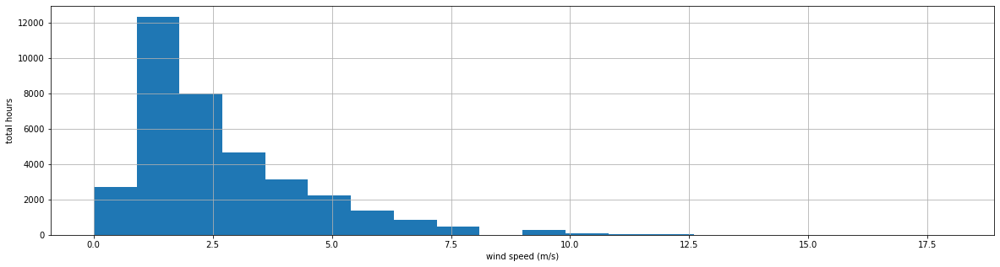

In [34]:
#Histogram of wind speed data in Madrid (frequency of different hourly wind speeds)
wind_speed_Madrid.hist(bins=20)
plt.xlabel('wind speed (m/s)')
plt.ylabel(f'total hours')

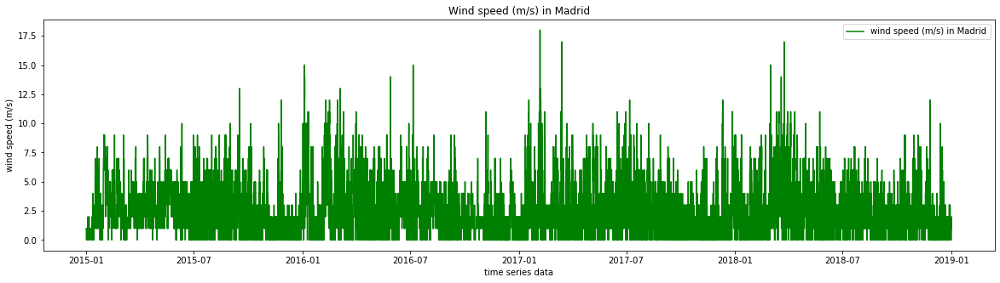

In [35]:

#plotting wind speed
rcParams['figure.figsize']=20,5
wind=plt.plot(wind_speed_Madrid,color='green',label='wind speed (m/s) in Madrid')
plt.legend(loc='best')
plt.title('Wind speed (m/s) in Madrid')
plt.xlabel('time series data')
plt.ylabel(f'wind speed (m/s)')
plt.show(block=False)

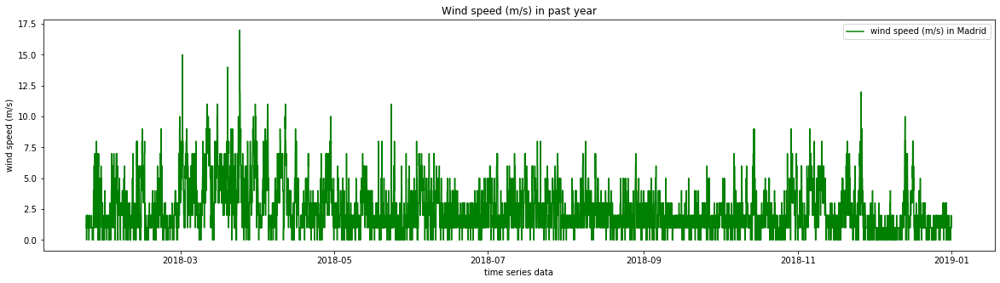

In [36]:
#plotting wind speed for the last year from dataset
rcParams['figure.figsize']=20,5
wind=plt.plot(wind_speed_Madrid[len(wind_speed_Madrid)-365*24:],color='green',label='wind speed (m/s) in Madrid')
plt.legend(loc='best')
plt.title('Wind speed (m/s) in past year')
plt.xlabel('time series data')
plt.ylabel(f'wind speed (m/s)')
plt.show(block=False)

In [37]:
df_load = pd.read_csv('energy_dataset.csv')
#dropping all column except total load actual, time, generation solar and wind onshore
df_load = df_load.drop(['generation fossil coal-derived gas','generation fossil oil shale', 
                            'generation fossil peat', 'generation geothermal', 
                            'generation hydro pumped storage aggregated', 'generation marine', 
                            'generation wind offshore', 'forecast wind offshore eday ahead', 'generation biomass', 'generation fossil brown coal/lignite',
       'generation fossil gas', 'generation fossil hard coal',
       'generation fossil oil', 'generation hydro pumped storage consumption',
       'generation hydro run-of-river and poundage',
       'generation hydro water reservoir', 'generation nuclear',
       'generation other', 'generation other renewable', #'generation solar',
       'generation waste', #'generation wind onshore',
       'forecast solar day ahead', 'forecast wind onshore day ahead',
       'total load forecast', 'price day ahead'], 
                            axis=1)
df_load.columns
df_load.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 5 columns):
time                       35064 non-null object
generation solar           35046 non-null float64
generation wind onshore    35046 non-null float64
total load actual          35028 non-null float64
price actual               35064 non-null float64
dtypes: float64(4), object(1)
memory usage: 1.3+ MB


In [38]:
#setting time index in df_load
df_load['time']=pd.to_datetime(df_load['time'],utc=True,format='%Y-%m-%d %H:%M:%S')
timeindexed_df_load=df_load.set_index(['time'])
timeindexed_df_load.head()

,generation solar,generation wind onshore,total load actual,price actual
time,,,,
2014-12-31 23:00:00+00:00,49.0,6378.0,25385.0,65.41
2015-01-01 00:00:00+00:00,50.0,5890.0,24382.0,64.92
2015-01-01 01:00:00+00:00,50.0,5461.0,22734.0,64.48
2015-01-01 02:00:00+00:00,50.0,5238.0,21286.0,59.32
2015-01-01 03:00:00+00:00,42.0,4935.0,20264.0,56.04


In [39]:
timeindexed_df_load.describe()

,generation solar,generation wind onshore,total load actual,price actual
count,35046.000000,35046.000000,35028.000000,35064.000000
mean,1432.665925,5464.479769,28696.939905,57.884023
std,1680.119887,3213.691587,4574.987950,14.204083
min,0.000000,0.000000,18041.000000,9.330000
25%,71.000000,2933.000000,24807.750000,49.347500
50%,616.000000,4849.000000,28901.000000,58.020000
75%,2578.000000,7398.000000,32192.000000,68.010000
max,5792.000000,17436.000000,41015.000000,116.800000


Actual total Load (including losses without stored energy) = Net Generation – Exports + Imports – Absorbed Energy

In [40]:
#separating load data for past one year
load_data_past_year=pd.DataFrame(timeindexed_df_load['total load actual'][len(df_load)-365*24:])
#load_data_past_year.index = range(0,8760)
load_data_past_year.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 8760 entries, 2017-12-31 23:00:00+00:00 to 2018-12-31 22:00:00+00:00
Data columns (total 1 columns):
total load actual    8758 non-null float64
dtypes: float64(1)
memory usage: 136.9 KB


In [41]:
load_data_past_year.tail()

,total load actual
time,
2018-12-31 18:00:00+00:00,30653.0
2018-12-31 19:00:00+00:00,29735.0
2018-12-31 20:00:00+00:00,28071.0
2018-12-31 21:00:00+00:00,25801.0
2018-12-31 22:00:00+00:00,24455.0


In [42]:
#separating wind speed data for past one year
windspeed_data_past_year_Madrid=wind_speed_Madrid[len(weather_data_Madrid)-365*24-26*24-9:].copy() 
#windspeed_data_past_year_Madrid.index = range(0,8760)
windspeed_data_past_year_Madrid.head()

dt_iso
2017-12-31 23:00:00+00:00    6
2018-01-01 00:00:00+00:00    4
2018-01-01 01:00:00+00:00    5
2018-01-01 02:00:00+00:00    5
2018-01-01 03:00:00+00:00    5
Name: wind_speed, dtype: int64

In [43]:
windspeed_data_past_year_Madrid.tail()

dt_iso
2018-12-31 18:00:00+00:00    1
2018-12-31 19:00:00+00:00    1
2018-12-31 20:00:00+00:00    1
2018-12-31 21:00:00+00:00    2
2018-12-31 22:00:00+00:00    1
Name: wind_speed, dtype: int64

Next figure shows the relationship between load and wind speed.

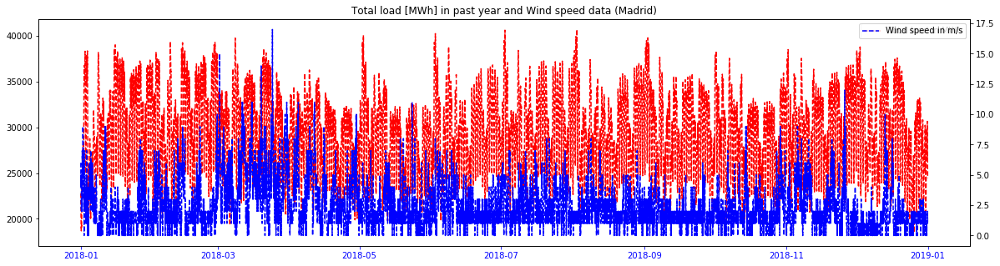

In [44]:
fig, ax = plt.subplots()
plt.plot(load_data_past_year, '--r', label='Total load in MWh')
plt.legend()
ax.tick_params('x', colors='r')

# Get second axis
ax2 = ax.twinx()
plt.plot(windspeed_data_past_year_Madrid, '--b', label='Wind speed in m/s')
#plt.plot(temp_Madrid[len(temp_Madrid)-365*24:], '--g', label='Te')
plt.legend()
ax.tick_params('x', colors='b')

plt.legend(loc='best')
plt.title('Total load [MWh] in past year and Wind speed data (Madrid)')
plt.show(block=False)

In [45]:
#separating temperature data for past one year
temperature_data_past_year_Madrid=temp_Madrid[len(temp_Madrid)-365*24-26*24-9:].copy() 
#temperature_data_past_year_Madrid.index = range(0,8760)
temperature_data_past_year_Madrid.head()

dt_iso
2017-12-31 23:00:00+00:00    6.44
2018-01-01 00:00:00+00:00    6.58
2018-01-01 01:00:00+00:00    7.58
2018-01-01 02:00:00+00:00    7.13
2018-01-01 03:00:00+00:00    6.01
Name: temp, dtype: float64

Next figure shows the relationship between load and temperature.

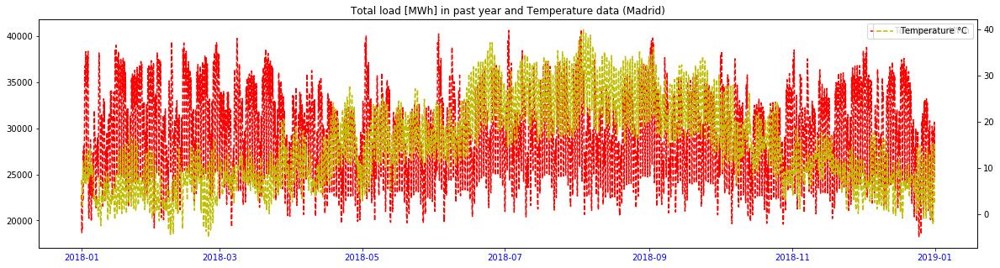

In [46]:
fig, ax = plt.subplots()
plt.plot(load_data_past_year, '--r',label='Total load in MWh')
plt.legend()
ax.tick_params('x', colors='r')
# Get second axis
ax2 = ax.twinx()
#plt.plot(wind_speed_Madrid[len(wind_speed_Madrid)-365*24:], '--g', label='Wind speed in m/s')
plt.plot(temperature_data_past_year_Madrid, '--y', label='Temperature °C ')
plt.legend()
ax.tick_params('x', colors='b')

plt.legend(loc='best')
plt.title('Total load [MWh] in past year and Temperature data (Madrid)')
plt.show(block=False)

In the cells bellow using Plotly's Python graphing library are shown hourly changes for one year load data, temperature and wind speed.

In [47]:
import plotly
#from plotly.offline import init_notebook_mode
import plotly.graph_objs as go
from plotly.offline import *
plotly.offline.init_notebook_mode(connected=True)
data=[go.Scatter(x=load_data_past_year.index,
                y=load_data_past_year['total load actual'],  name=''
)]
layout = go.Layout(
    title='Load, one year data',
    yaxis=dict(
        title='load data MWh'
    )
)
fig = go.Figure(data=data, layout=layout)
plotly.offline.iplot(fig)

In [48]:
data1 = go.Scatter(x=load_data_past_year.index,
                y=load_data_past_year['total load actual'],
                name='one year load data'
)
data2 = go.Scatter(
    x=temperature_data_past_year_Madrid.index,
    y=temperature_data_past_year_Madrid,
    name='temperature data',
    yaxis='y2'
)
data = [data1, data2]
layout = go.Layout(
    title='Load and temperature, one year data',
    yaxis=dict(
        title='load data MWh'
    ),
    yaxis2=dict(
        title='temperature data',
        titlefont=dict(
            color='rgb(148, 103, 189)'
        ),
        tickfont=dict(
            color='rgb(148, 103, 189)'
        ),
        overlaying='y',
        side='right'
    )
)
fig = go.Figure(data=data, layout=layout)
plotly.offline.iplot(fig)

In [49]:
data1 = go.Scatter(x=load_data_past_year.index,
                y=load_data_past_year['total load actual'],
                name='one year load data'
)
data3 = go.Scatter(
    x=windspeed_data_past_year_Madrid.index,
    y=windspeed_data_past_year_Madrid,
    name='wind speed data',
    yaxis='y2'
)
data = [data1, data3]
layout = go.Layout(
    title='Load and windspeed, one year data',
    yaxis=dict(
        title='load data MWh'
    ),
    yaxis2=dict(
        title='wind speed data',
        titlefont=dict(
            color='rgb(148, 103, 189)'
        ),
        tickfont=dict(
            color='rgb(148, 103, 189)'
        ),
        overlaying='y',
        side='right'
    )
)
fig = go.Figure(data=data, layout=layout)
plotly.offline.iplot(fig)

In [50]:
data4 = go.Scatter(x=timeindexed_df_load.index,
                y=timeindexed_df_load['price actual'],
                name='one year price actual data'
)
data5 = go.Scatter(
    x=timeindexed_df_load.index,
    y=timeindexed_df_load['generation solar'],
    name='generation solar',
    yaxis='y2'
)
data6 = go.Scatter(
    x=timeindexed_df_load.index,
    y=timeindexed_df_load['generation wind onshore'],
    name='generation wind onshore',
    yaxis='y3'
)
data = [data4, data5,data6]
layout = go.Layout(
    legend=dict(x=1,y=1.2,font=dict(size=10)),
    title='Hourly prices, wind and solar generation',
    yaxis=dict(
        title='price EUR/MWh'
    ),
    yaxis2=dict(
        title='generation solar',
        titlefont=dict(
            color='rgb(148, 103, 189)'
        ),
        tickfont=dict(
            color='rgb(148, 103, 189)'
        ),
        overlaying='y',
        side='right'
    ),
     yaxis3=dict(
        title='generation wind onshore',
        titlefont=dict(
            color='rgb(148, 148, 189)'
        ),
        tickfont=dict(
            color='rgb(148, 148, 189)'
        ),
        anchor='free', 
        overlaying='y',
        side='right',
        position=0.90
    )
)

fig = go.Figure(data=data, layout=layout)

plotly.offline.iplot(fig)